In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import euclidean, cosine
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score

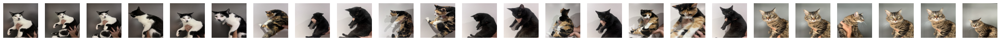

In [129]:
# Mostrando as imagens originais e as imagens com BLUR
images_path = "/Users/bernardozamin/Documents/T1-VisaoComputacional/data"
images = [img for img in os.listdir(images_path) if img != ".DS_Store"]
fig, axs = plt.subplots(1, len(images), figsize=(40, 40))

imgs = []
for i, image in enumerate(images):
    image_path = os.path.join(images_path, image)
    img = cv2.imread(image_path)
    resized_img = cv2.resize(img, (512, 512))
    imgs.append(resized_img)
    axs[i].imshow(cv2.cvtColor(imgs[i], cv2.COLOR_BGR2RGB))
    axs[i].axis('off')

plt.show()



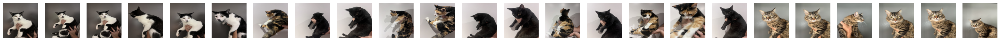

In [130]:
imgs_blur = []
fig, axs = plt.subplots(1, len(images), figsize=(40, 40))
for i, image in enumerate(images):
    image_path = os.path.join(images_path, image)
    img = cv2.imread(image_path)
    img_blur = cv2.GaussianBlur(img, (25, 25), 0)
    resized_img = cv2.resize(img_blur, (512, 512))  
    imgs_blur.append(resized_img)
    axs[i].imshow(cv2.cvtColor(imgs_blur[i], cv2.COLOR_BGR2RGB))
    axs[i].axis('off')

plt.show()


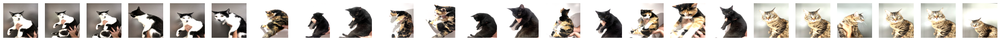

In [131]:
imgs_saturate = []
fig, axs = plt.subplots(1, len(images), figsize=(40, 40))
for i, image in enumerate(images):
    image_path = os.path.join(images_path, image)
    img = cv2.imread(image_path)
    img_saturate = cv2.convertScaleAbs(img, alpha=1.5, beta=0)
    resized_img = cv2.resize(img_saturate, (512, 512))
    imgs_saturate.append(resized_img)
    axs[i].imshow(cv2.cvtColor(imgs_saturate[i], cv2.COLOR_BGR2RGB))
    axs[i].axis('off')

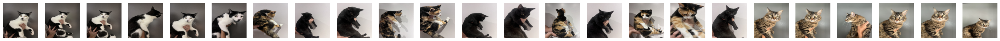

In [132]:
imgs_flip = []
fig, axs = plt.subplots(1, len(images), figsize=(40, 40))
for i, image in enumerate(images):
    image_path = os.path.join(images_path, image)
    img = cv2.imread(image_path)
    img_flip = cv2.flip(img, 1)
    img_flip = cv2.resize(img_flip, (512, 512))
    imgs_flip.append(img_flip)
    axs[i].imshow(cv2.cvtColor(img_flip, cv2.COLOR_BGR2RGB))
    axs[i].axis('off')

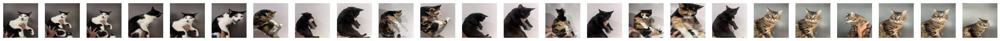

In [133]:
imgs_flip_blur = []
fig, axs = plt.subplots(1, len(images), figsize=(40, 40))
for i, image in enumerate(images):
    image_path = os.path.join(images_path, image)
    img = cv2.imread(image_path)
    img_flip_blur = cv2.flip(cv2.GaussianBlur(img, (25, 25), 0), 1)
    img_flip_blur = cv2.resize(img_flip_blur, (512, 512))
    imgs_flip_blur.append(img_flip_blur)
    axs[i].imshow(cv2.cvtColor(img_flip_blur, cv2.COLOR_BGR2RGB))
    axs[i].axis('off')

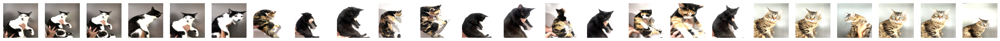

In [134]:
imgs_flip_saturate = []
fig, axs = plt.subplots(1, len(images), figsize=(40, 40))
for i, image in enumerate(images):
    image_path = os.path.join(images_path, image)
    img = cv2.imread(image_path)
    img_flip_saturate = cv2.flip(cv2.convertScaleAbs(img, alpha=1.5, beta=0), 1)
    img_flip_saturate = cv2.resize(img_flip_saturate, (512, 512))
    imgs_flip_saturate.append(img_flip_saturate)
    axs[i].imshow(cv2.cvtColor(img_flip_saturate, cv2.COLOR_BGR2RGB))
    axs[i].axis('off')
    

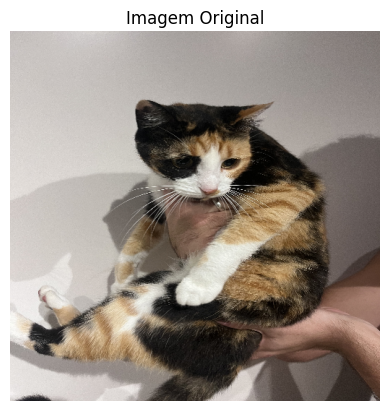

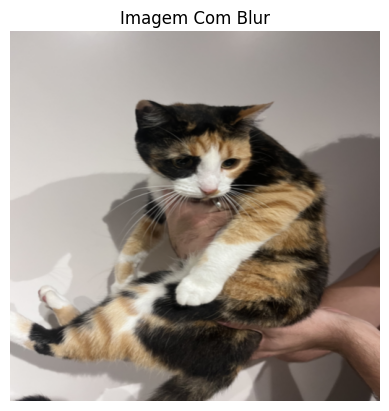

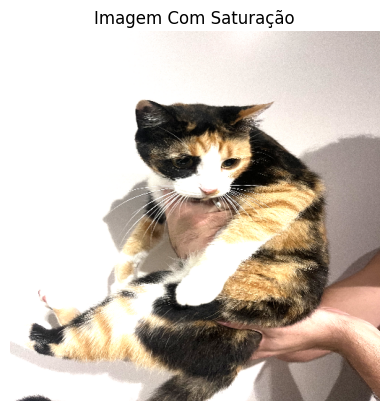

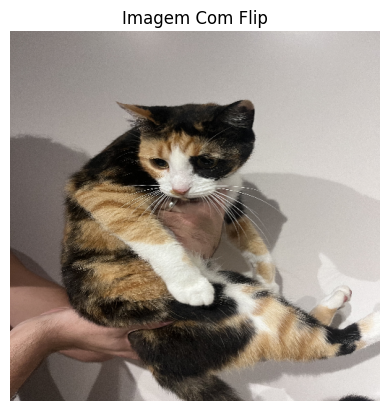

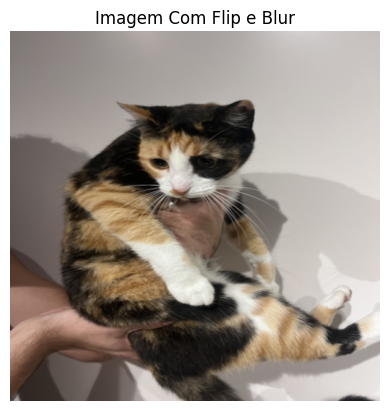

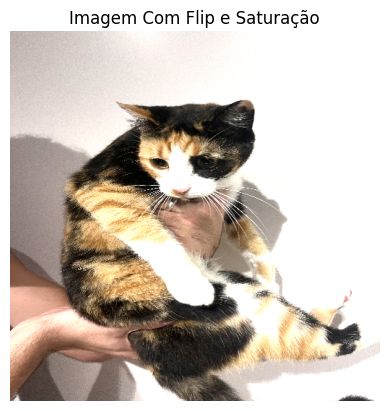

In [135]:
plt.imshow(cv2.cvtColor(imgs[15], cv2.COLOR_BGR2RGB))
plt.title("Imagem Original")
plt.axis('off')
plt.show()

plt.imshow(cv2.cvtColor(imgs_blur[15], cv2.COLOR_BGR2RGB))
plt.title("Imagem Com Blur")
plt.axis('off')
plt.show()

plt.imshow(cv2.cvtColor(imgs_saturate[15], cv2.COLOR_BGR2RGB))
plt.title("Imagem Com Saturação")
plt.axis('off')
plt.show()

plt.imshow(cv2.cvtColor(imgs_flip[15], cv2.COLOR_BGR2RGB))
plt.title("Imagem Com Flip")
plt.axis('off')
plt.show()

plt.imshow(cv2.cvtColor(imgs_flip_blur[15], cv2.COLOR_BGR2RGB))
plt.title("Imagem Com Flip e Blur")
plt.axis('off')
plt.show()

plt.imshow(cv2.cvtColor(imgs_flip_saturate[15], cv2.COLOR_BGR2RGB))
plt.title("Imagem Com Flip e Saturação")
plt.axis('off')
plt.show()



In [136]:
euclidean(imgs[0].flatten(), imgs_blur[0].flatten())

150876.39963890973

In [137]:
euclidean(imgs[0].flatten(), imgs_blur[1].flatten())

127704.64285216885

In [138]:
labels = []
labels = [img for img in os.listdir(images_path) if img != ".DS_Store"]
labels *= 6

labels = [img.split('.')[0][:-1]for img in labels]
print(labels)

data = []
for i in range(len(imgs)):
    data.append(imgs[i].flatten())
    data.append(imgs_blur[i].flatten())
    data.append(imgs_saturate[i].flatten())
    data.append(imgs_flip[i].flatten())
    data.append(imgs_flip_blur[i].flatten())
    data.append(imgs_flip_saturate[i].flatten())
print(len(data))

['milka', 'milka', 'milka', 'milka', 'milka', 'milka', 'nala', 'zoe', 'zoe', 'nala', 'nala', 'zoe', 'zoe', 'nala', 'zoe', 'nala', 'nala', 'zoe', 'luna', 'luna', 'luna', 'luna', 'luna', 'luna', 'milka', 'milka', 'milka', 'milka', 'milka', 'milka', 'nala', 'zoe', 'zoe', 'nala', 'nala', 'zoe', 'zoe', 'nala', 'zoe', 'nala', 'nala', 'zoe', 'luna', 'luna', 'luna', 'luna', 'luna', 'luna', 'milka', 'milka', 'milka', 'milka', 'milka', 'milka', 'nala', 'zoe', 'zoe', 'nala', 'nala', 'zoe', 'zoe', 'nala', 'zoe', 'nala', 'nala', 'zoe', 'luna', 'luna', 'luna', 'luna', 'luna', 'luna', 'milka', 'milka', 'milka', 'milka', 'milka', 'milka', 'nala', 'zoe', 'zoe', 'nala', 'nala', 'zoe', 'zoe', 'nala', 'zoe', 'nala', 'nala', 'zoe', 'luna', 'luna', 'luna', 'luna', 'luna', 'luna', 'milka', 'milka', 'milka', 'milka', 'milka', 'milka', 'nala', 'zoe', 'zoe', 'nala', 'nala', 'zoe', 'zoe', 'nala', 'zoe', 'nala', 'nala', 'zoe', 'luna', 'luna', 'luna', 'luna', 'luna', 'luna', 'milka', 'milka', 'milka', 'milka', 'mi

In [139]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.3, random_state=42)

model = KNeighborsClassifier(n_neighbors=2, metric='euclidean', weights='distance')
model.fit(X_train, y_train)

predicao = model.predict(X_test)

print(classification_report(y_test, predicao))
print("Acuracia:", accuracy_score(y_test, predicao))

              precision    recall  f1-score   support

        luna       0.73      0.73      0.73        11
       milka       1.00      0.75      0.86        12
        nala       0.37      0.88      0.52         8
         zoe       0.40      0.15      0.22        13

    accuracy                           0.59        44
   macro avg       0.62      0.63      0.58        44
weighted avg       0.64      0.59      0.58        44

Acuracia: 0.5909090909090909


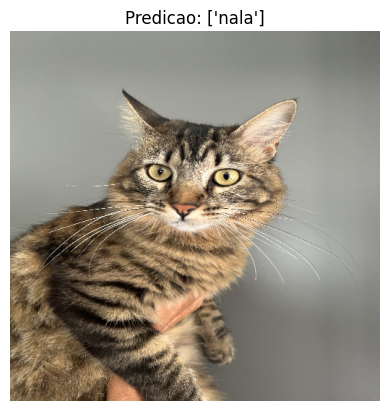

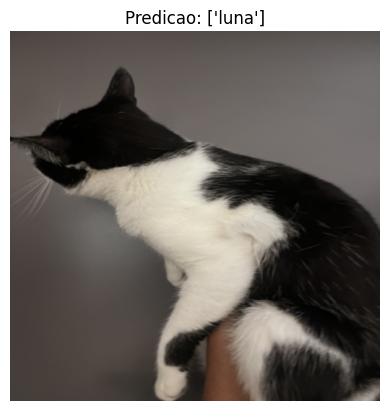

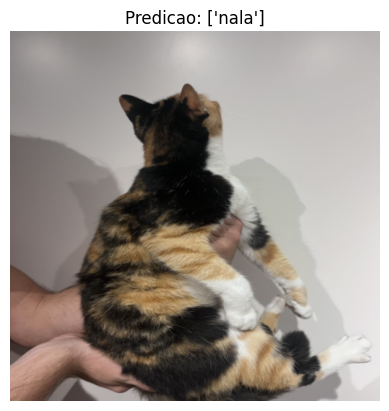

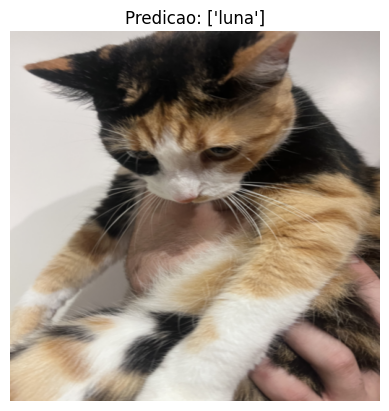

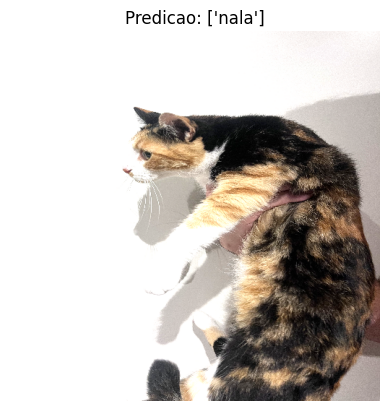

...

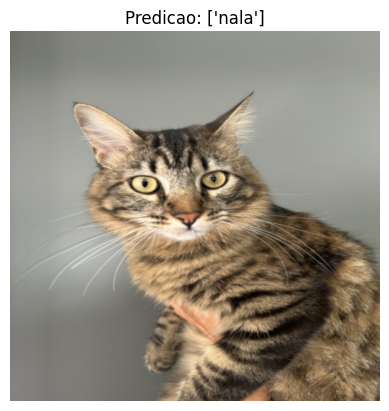

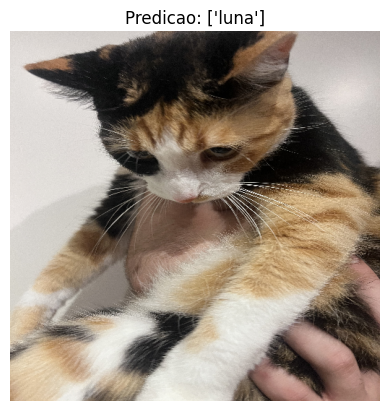

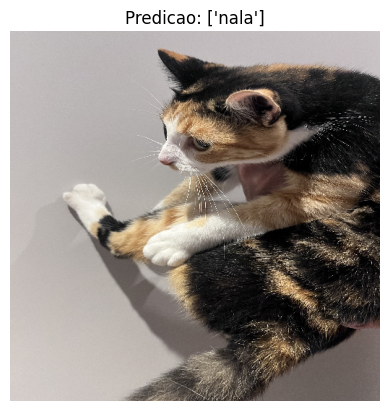

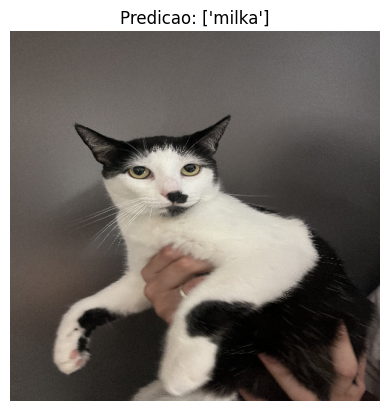

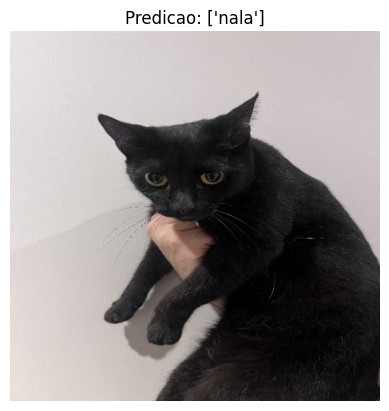

In [157]:
for i in X_test:
    img = np.array(i).reshape(512, 512, 3)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Predicao: {model.predict([i])}" )
    plt.axis('off')
    plt.show()
